In [1]:
import datetime
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.units as munits
import numpy as np

# Forecasting Lapa station temperature

In [2]:
cge = pd.read_csv("../data/processed/lapa2.csv")
cge = cge.dropna()

cge = cge.drop(["week", "day_of_month", "month", "season"], axis=1)

In [3]:
cge[["uhi"]].describe()

,uhi
count,24045.000000
mean,2.256245
std,1.824781
min,-9.891667
25%,1.206833
50%,2.254333
75%,3.194167
max,14.024333


In [4]:
ts = cge[["timestamp"]]
ts.head()

,timestamp
36,2016-01-23 02:00:00
37,2016-01-23 03:00:00
38,2016-01-23 04:00:00
39,2016-01-23 05:00:00
40,2016-01-23 06:00:00


In [5]:
def make_steps(df, y):
    for i in range(6):
        df[f"{y}_step_{i+1}"] = df[y].shift(-i+1)
    return df

y = make_steps(df=cge[["uhi"]], y="uhi").drop("uhi", axis=1)
y = y.dropna()

y

/tmp/ipykernel_1235/1613697006.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f"{y}_step_{i+1}"] = df[y].shift(-i+1)
/tmp/ipykernel_1235/1613697006.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[f"{y}_step_{i+1}"] = df[y].shift(-i+1)
/tmp/ipykernel_1235/1613697006.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/

,uhi_step_1,uhi_step_2,uhi_step_3,uhi_step_4,uhi_step_5,uhi_step_6
37,2.454167,2.477667,2.489500,2.513333,2.578500,2.593333
38,2.477667,2.489500,2.513333,2.578500,2.593333,2.659167
39,2.489500,2.513333,2.578500,2.593333,2.659167,2.508000
40,2.513333,2.578500,2.593333,2.659167,2.508000,2.820000
41,2.578500,2.593333,2.659167,2.508000,2.820000,3.632333
...,...,...,...,...,...,...
26962,2.924167,2.296167,1.732167,1.735667,1.764333,1.213333
26963,2.296167,1.732167,1.735667,1.764333,1.213333,1.221667
26964,1.732167,1.735667,1.764333,1.213333,1.221667,1.257500
26965,1.735667,1.764333,1.213333,1.221667,1.257500,1.388333


In [6]:
X = cge.drop(["timestamp", "uhi", "precipitation", "temperature", "relative_humidity", "pressure", "wind_velocity_x", "wind_velocity_y", "wind_blow_x", "wind_blow_y"], axis=1)
X = X.loc[y.index.min():y.index.max()]
X

,precipitation_rural,temperature_rural,relative_humidity_rural,pressure_rural,wind_velocity_x_rural,wind_velocity_y_rural,wind_blow_x_rural,wind_blow_y_rural,precipitation_outlier,temperature_outlier,...,wind_blow_y_rural_outlier_window_24H_max,wind_blow_y_rural_outlier_window_24H_sum,month_sin,month_cos,hour_sin,hour_cos,season_autumn,season_spring,season_summer,season_winter
37,0.25,16.384333,98.178667,926.105000,-0.121687,-0.722942,0.292614,-2.405102,0,0,...,0.0,0.0,0.500000,0.866025,0.730836,0.682553,0,0,1,0
38,0.25,16.186167,97.962833,925.025000,0.178656,-0.383265,0.643784,-1.571971,0,0,...,0.0,0.0,0.500000,0.866025,0.887885,0.460065,0,0,1,0
39,0.25,16.078667,98.082000,924.495000,-0.044973,-0.116987,-0.205362,-1.253170,0,0,...,0.0,0.0,0.500000,0.866025,0.979084,0.203456,0,0,1,0
40,0.25,16.132333,98.031167,924.263333,0.000000,0.000000,-0.177734,-0.435089,0,0,...,0.0,0.0,0.500000,0.866025,0.997669,-0.068242,0,0,1,0
41,0.25,16.324000,98.205833,923.995000,-0.082272,-0.203316,-0.299451,-0.723825,0,0,...,0.0,0.0,0.500000,0.866025,0.942261,-0.334880,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26962,3.00,19.766667,99.979833,922.246667,-0.014681,0.060923,-0.351540,0.043818,0,0,...,1.0,1.0,0.866025,0.500000,0.000000,1.000000,0,0,1,0
26963,3.00,19.771667,99.993000,922.950000,-0.006808,0.030585,-0.112178,0.520712,0,0,...,1.0,1.0,0.866025,0.500000,0.269797,0.962917,0,0,1,0
26964,3.00,19.704667,99.993000,923.000000,-0.019455,0.091965,-0.071878,0.337084,0,0,...,1.0,1.0,0.866025,0.500000,0.519584,0.854419,0,0,1,0
26965,3.00,19.528167,99.993000,922.770000,0.000000,0.000000,0.090741,0.930065,0,0,...,1.0,1.0,0.866025,0.500000,0.730836,0.682553,0,0,1,0


In [7]:
ts = ts.loc[y.index.min():y.index.max()]
ts

,timestamp
37,2016-01-23 03:00:00
38,2016-01-23 04:00:00
39,2016-01-23 05:00:00
40,2016-01-23 06:00:00
41,2016-01-23 07:00:00
...,...
26962,2019-02-18 00:00:00
26963,2019-02-18 01:00:00
26964,2019-02-18 02:00:00
26965,2019-02-18 03:00:00


In [8]:
# the following code lines are necessary to import custom module
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.multioutput import RegressorChain
from sklearn.ensemble import HistGradientBoostingRegressor
from sklearn.linear_model import (LassoCV, RidgeCV, TweedieRegressor, RANSACRegressor, 
                                  TheilSenRegressor, HuberRegressor, PassiveAggressiveRegressor,
                                  ElasticNetCV, BayesianRidge)
from sklearn.model_selection import TimeSeriesSplit
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import VotingRegressor

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, shuffle=False)

##### RIDGE
# MSE
# Mean: 1.39
# Standard deviation: +-1.08

# model = RegressorChain(
#     RidgeCV(
#         alphas=np.logspace(-6, 6, 25), 
#         cv=TimeSeriesSplit(n_splits=3),
#     )
# )

###### LASSO
# MSE
# Mean: 1.37
# Standard deviation: +-1.1

# model = RegressorChain(
#     LassoCV(
#         cv=TimeSeriesSplit(n_splits=3),
#         n_jobs=-1,
#         random_state=123
#     )
# )

###### GB
# MSE
# Mean: 1.41
# Standard deviation: +-1.13

# model = RegressorChain(
#     HistGradientBoostingRegressor( 
#         warm_start=True,
#         early_stopping=False,
#         random_state=123
#     )
# )

##### TweedieRegressor
# MSE
# Mean: 1.48
# Standard deviation: +-1.06

# model = RegressorChain(
#     GridSearchCV(
#         estimator=TweedieRegressor(warm_start=True),
#         param_grid={"alpha": np.logspace(-6, 1, 6)},
#         cv=TimeSeriesSplit(n_splits=3),
#         n_jobs=-1
#     )
# )

##### RANSAC
# MSE
# Mean: 383707.39
# Standard deviation: +-1024233.31

# model = RegressorChain(RANSACRegressor())

# model = RegressorChain(TheilSenRegressor())

###### HuberRegressor
# MSE
# Mean: 1.49
# Standard deviation: +-1.08

# model = RegressorChain(HuberRegressor())

###### PassiveAggressiveRegressor
# MSE
# Mean: 2.19
# Standard deviation: +-0.93

model1 = RegressorChain(PassiveAggressiveRegressor())

##### ElasticNetCV
# MSE
# Mean: 1.36
# Standard deviation: +-1.09

model2 = RegressorChain(
    ElasticNetCV(
        cv=TimeSeriesSplit(n_splits=3),
        n_jobs=-1,
        random_state=123
    )
)

###### BayesianRidge
# MSE
# Mean: 1.39
# Standard deviation: +-1.08

# model = RegressorChain(BayesianRidge())

model = VotingRegressor(estimators=[('PassiveAggressiveRegressor', model1), ('ElasticNetCV', model2)])

model.fit(X_train, y_train)

y_fit = pd.DataFrame(model.predict(X_train), index=X_train.index, columns=y.columns)
y_pred = pd.DataFrame(model.predict(X_test), index=X_test.index, columns=y.columns)

<AxesSubplot: >

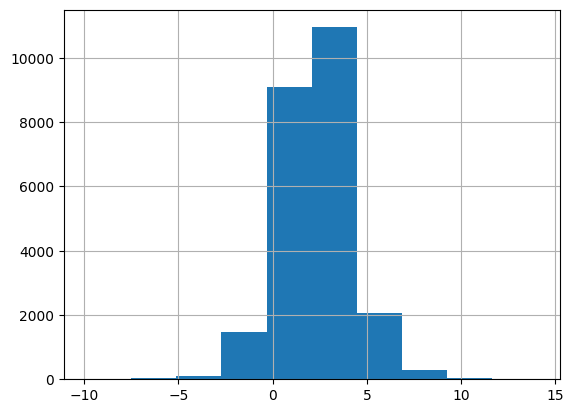

In [9]:
cge.uhi.hist()

<AxesSubplot: xlabel='timestamp'>

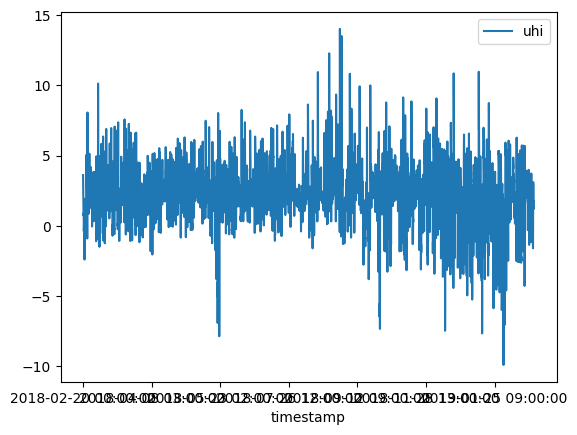

In [10]:
test = cge[X_test.index[0]:X_test.index[-1]][["timestamp", "uhi"]].set_index("timestamp")
test.plot()

In [11]:
test.index = pd.to_datetime(test.index)
test

,uhi
timestamp,
2018-02-20 00:00:00,3.620833
2018-02-20 01:00:00,3.333667
2018-02-20 02:00:00,3.023600
2018-02-20 03:00:00,2.430667
2018-02-20 04:00:00,1.871667
...,...
2019-02-18 04:00:00,1.213333
2019-02-18 05:00:00,1.221667
2019-02-18 06:00:00,1.257500


In [12]:
ts.timestamp = pd.to_datetime(ts.timestamp)
y_pred["timestamp"] = ts[y_pred.index[0]:y_pred.index[-1]]["timestamp"]
y_pred = y_pred.dropna()
y_pred

,uhi_step_1,uhi_step_2,uhi_step_3,uhi_step_4,uhi_step_5,uhi_step_6,timestamp
18251,3.613749,3.126590,2.906497,2.741679,2.508054,2.701048,2018-02-20 01:00:00
18252,3.341954,2.822692,2.482263,2.275010,2.479653,2.393583,2018-02-20 02:00:00
18253,3.010544,2.262717,1.897047,2.158004,2.126118,1.799354,2018-02-20 03:00:00
18254,2.411766,1.895559,2.027851,1.967362,1.634712,1.402507,2018-02-20 04:00:00
18255,1.861853,1.585496,1.585328,1.443960,1.286382,1.511477,2018-02-20 05:00:00
...,...,...,...,...,...,...,...
26962,2.912270,2.995504,2.861265,2.467192,1.939243,1.293942,2019-02-18 00:00:00
26963,2.289998,2.245079,2.094027,1.649431,1.012793,0.823495,2019-02-18 01:00:00
26964,1.734136,1.656786,1.415967,0.915552,0.709019,0.914538,2019-02-18 02:00:00
26965,1.757374,1.472372,0.896133,0.872012,1.152724,1.770606,2019-02-18 03:00:00


/tmp/ipykernel_1235/1949741178.py:16: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots(figsize=(9,3))


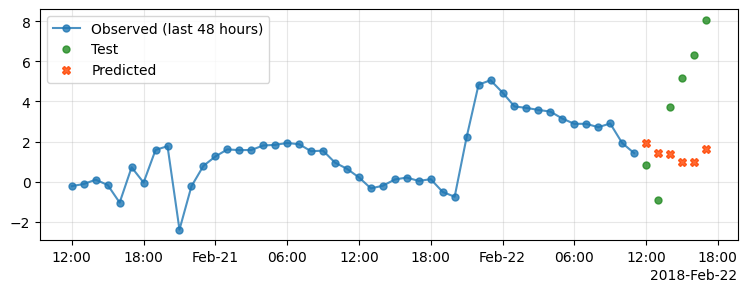

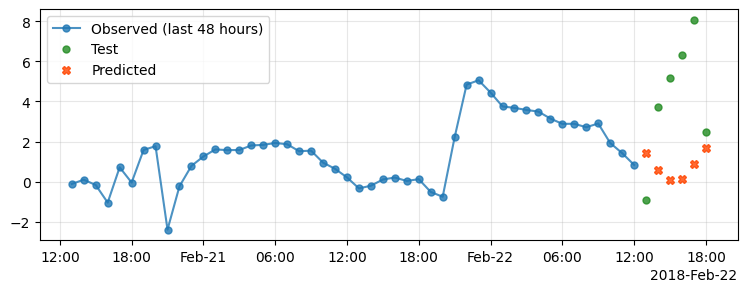

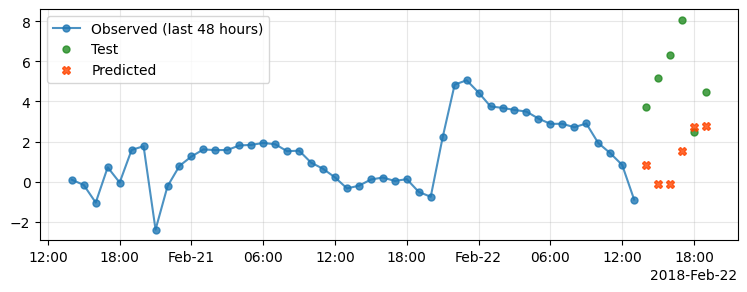

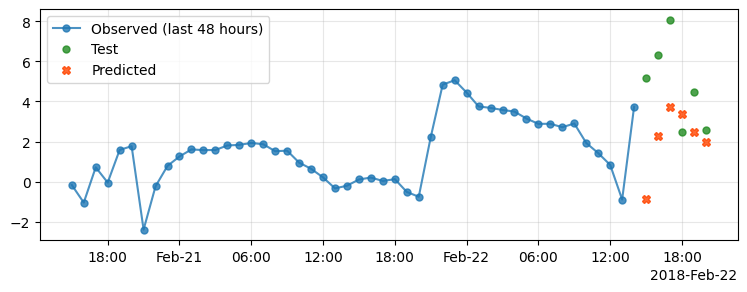

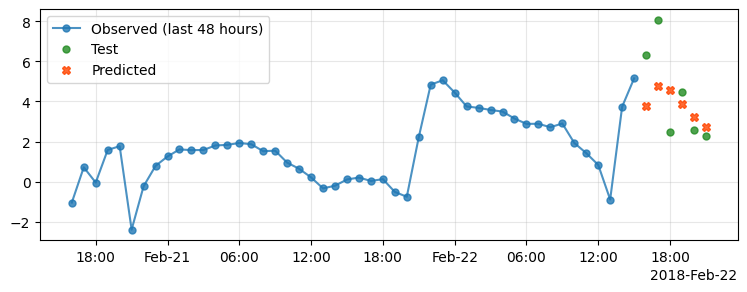

...

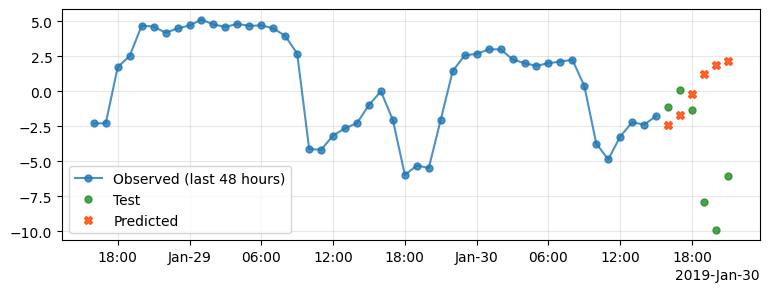

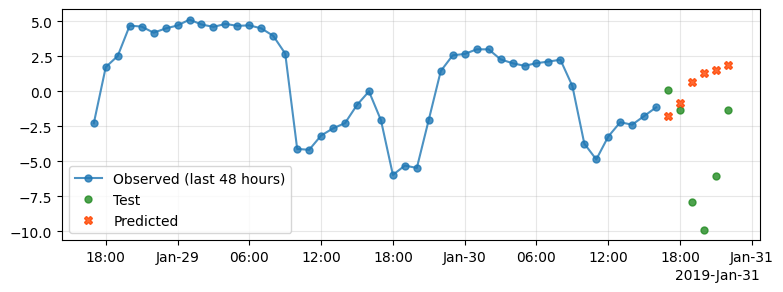

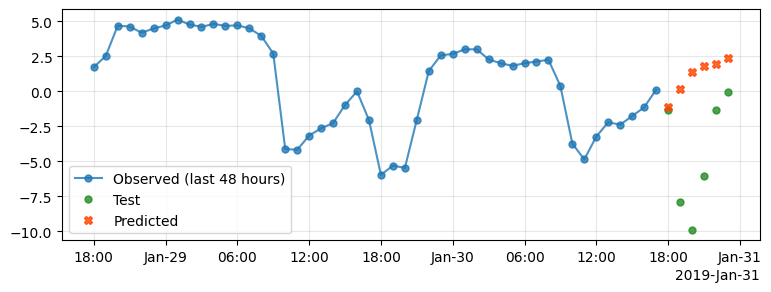

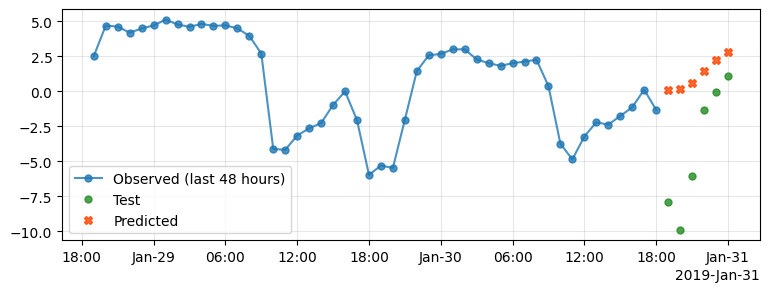

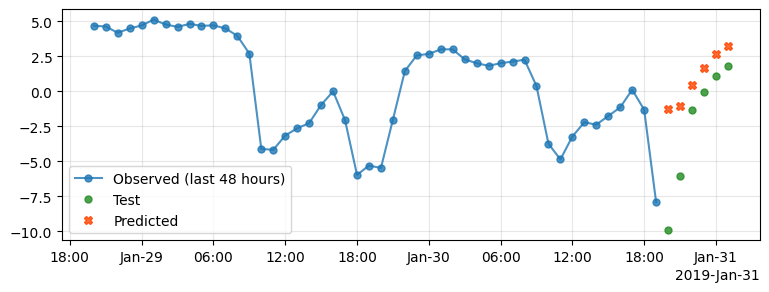

In [13]:
converter = mdates.ConciseDateConverter()
munits.registry[np.datetime64] = converter
munits.registry[datetime.date] = converter
munits.registry[datetime.datetime] = converter

for i in y_pred.index:
    pred = y_pred.loc[[i]]
    start_date = pred.timestamp.unique()[0] + np.timedelta64(1,'h')
    pred = pred.drop("timestamp", axis=1).T
    pred.index = pd.date_range(start=start_date, periods=6, freq="H")
    pred.columns = ["uhi"]
    past_data = 48
    train_plot = test[pred.index[0]-np.timedelta64(past_data,'h'):pred.index[0]-np.timedelta64(1,'h')]
    test_plot = test[pred.index[0]:pred.index[-1]]
    if sum(test_plot.uhi > 6) > 1 or sum(test_plot.uhi < -6) > 1:
        fig, ax = plt.subplots(figsize=(9,3))
        ax.plot(train_plot, label=f"Observed (last {past_data} hours)", marker=".", markersize=10, alpha=0.8)
        ax.plot(test_plot, label="Test", ls="", marker=".", markersize=10, color="forestgreen", alpha=0.8)
        ax.plot(pred, label="Predicted", ls="", marker="X", markersize=6, color="orangered", alpha=0.8)
        # ax.set_xticks(pd.concat([train_plot, test_plot]).reset_index().timestamp)
        ax.legend()
        ax.grid(alpha=0.3)

In [14]:
test_dfs = []
pred_dfs = []
mse = []
for i in y_pred.index:
    pred = y_pred.loc[[i]]
    start_date = pred.timestamp.unique()[0] + np.timedelta64(1,'h')
    pred = pred.drop("timestamp", axis=1).T
    pred.index = pd.date_range(start=start_date, periods=6, freq="H")
    pred.columns = ["uhi"]
    test_plot = test[pred.index[0]:pred.index[-1]]
    try:
        mse.append(mean_squared_error(test_plot, pred, squared=False))
        test_dfs.append(test_plot)
        pred_dfs.append(pred)
    except:
        pass

In [15]:
# plt.figure(dpi=100, figsize=(5,5))
# plt.scatter(y_test, y_pred, alpha=0.4, label='Predictions')
# plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--', label='Perfect model', color='red')
# # plt.xlim(y_test.min(), y_test.max())
# # plt.ylim=(y_test.min(), y_test.max())
# plt.xlabel("Observed temp. (°C)")
# plt.ylabel("Predicted temp. (°C)")
# plt.grid(alpha=0.4)
# plt.legend()
# plt.show()

In [16]:
print(f"MSE")
print(f"Mean: {np.round(np.mean(mse), 2)}") 
print(f"Standard deviation: +-{np.round(np.std(mse), 2)}")

MSE
Mean: 1.39
Standard deviation: +-1.08


In [17]:
cge.uhi.std()

1.8247810946118241